# Sports Image Classification Using EfficientNetB0

## Data Loading

In [5]:
# Downloading dataset via Kaggle

!kaggle datasets download -d gpiosenka/sports-classification

Dataset URL: https://www.kaggle.com/datasets/gpiosenka/sports-classification
License(s): CC0-1.0
sports-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [6]:
# Extracting data from zipfile

import zipfile

extract_path = "/content/sports image"

zipfile_ref = zipfile.ZipFile('/content/sports-classification.zip', 'r')
zipfile_ref.extractall(extract_path)
zipfile_ref.close()

## Data Preparation

In [21]:
# Improting Necessory Libraries

import os
import cv2
import pathlib
import glob as gb
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

import keras
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tensorflow.keras.models import Sequential,Model
from keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPool2D, Dense, Flatten,GlobalAveragePooling2D, Dropout

import warnings
warnings.filterwarnings('ignore')

In [22]:
def create_dataframe(data_dir):
    image_paths = []
    labels = []
    for category in os.listdir(data_dir):
        category_path = os.path.join(data_dir, category)
        if os.path.isdir(category_path):
            for filename in os.listdir(category_path):
                if filename.endswith(('.jpg', '.jpeg', '.png')):
                    image_paths.append(os.path.join(category_path, filename))
                    labels.append(category)

    return pd.DataFrame({'filepaths': image_paths, 'labels': labels})

In [23]:
dataset = '/content/sports image'

train_df = create_dataframe(os.path.join(dataset, "train"))
valid_df = create_dataframe(os.path.join(dataset, "valid"))
test_df = create_dataframe(os.path.join(dataset, "test"))

print(f'Train Dataframe Shape: {train_df.shape}')
print(f'Validation Dataframe Shape: {valid_df.shape}')
print(f'Test Dataframe Shape: {test_df.shape}')

Train Dataframe Shape: (13492, 2)
Validation Dataframe Shape: (500, 2)
Test Dataframe Shape: (500, 2)


In [10]:
print(f'Train Dataframe Head: \n{train_df.head()}')
print(f'Validation Dataframe Head: \n{valid_df.head()}')
print(f'Test Dataframe Head: \n{test_df.head()}')

Train Dataframe Head: 
                                           filepaths         labels
0  /content/sports image/train/water cycling/086.jpg  water cycling
1  /content/sports image/train/water cycling/101.jpg  water cycling
2  /content/sports image/train/water cycling/031.jpg  water cycling
3  /content/sports image/train/water cycling/030.jpg  water cycling
4  /content/sports image/train/water cycling/011.jpg  water cycling
Validation Dataframe Head: 
                                         filepaths         labels
0  /content/sports image/valid/water cycling/1.jpg  water cycling
1  /content/sports image/valid/water cycling/5.jpg  water cycling
2  /content/sports image/valid/water cycling/2.jpg  water cycling
3  /content/sports image/valid/water cycling/3.jpg  water cycling
4  /content/sports image/valid/water cycling/4.jpg  water cycling
Test Dataframe Head: 
                                        filepaths         labels
0  /content/sports image/test/water cycling/1.jpg  water c

In [11]:
# #Convert labels to numbers
lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.fit_transform(valid_df['labels'])
test_df['encoded_labels'] = lb.fit_transform(test_df['labels'])

## Data Visualization

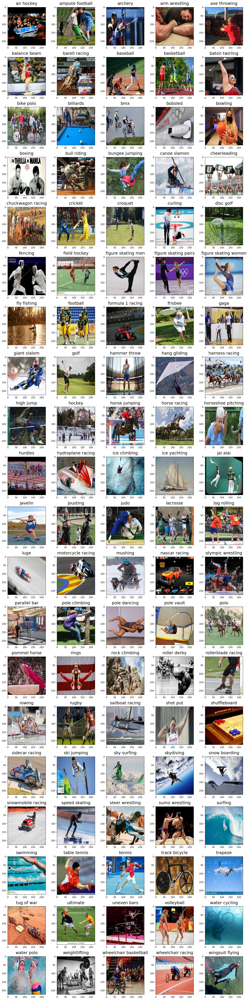

In [12]:
images = []

for food_folder in sorted(train_df['labels'].unique()):
    food_items = train_df[train_df['labels'] == food_folder]['filepaths'].tolist()
    food_selected = np.random.choice(food_items)
    images.append(food_selected)

num_images = len(images)
num_cols = 5
num_rows = int(np.ceil(num_images / num_cols))

fig = plt.figure(1, figsize=(15, num_rows * 3))

for subplot, image_ in enumerate(images):
    category = image_.split('/')[-2]
    imgs = plt.imread(image_)
    a, b, c = imgs.shape

    fig = plt.subplot(num_rows, num_cols, subplot + 1)

    fig.set_title(category, pad=10, size=18)
    plt.imshow(imgs)

plt.tight_layout()

## Data Preprocessing

In [24]:
# Data Augmentation

BATCH_SIZE = 10
IMAGE_SIZE = (224, 224)


generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,

)

train_gen = generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='filepaths',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
)

valid_gen = generator.flow_from_dataframe(
    dataframe=valid_df,
    x_col='filepaths',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_gen = generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='filepaths',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 13492 validated image filenames belonging to 100 classes.
Found 500 validated image filenames belonging to 100 classes.
Found 500 validated image filenames belonging to 100 classes.


## Model Building

In [25]:
pretrained_model.trainable = True
for layer in pretrained_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

for l in pretrained_model.layers[:10]:
    print(l.name, l.trainable)

input_layer False
rescaling False
normalization False
rescaling_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False


In [26]:
num_classes = len(train_gen.class_indices)

augment = tf.keras.Sequential([
  tf.keras.layers.RandomFlip("horizontal"),
  tf.keras.layers.RandomRotation(0.1),
  tf.keras.layers.RandomZoom(0.1),
  tf.keras.layers.RandomContrast(0.1),
], name='AugmentationLayer')


In [27]:
inputs = layers.Input(shape = (224,224,3), name='inputLayer')
x = augment(inputs)
pretrain_out = pretrained_model(x, training = False)
x = layers.Dense(350)(pretrain_out)
x = layers.Activation(activation="relu")(x)
x = BatchNormalization()(x)
x = layers.Dropout(0.25)(x)
x = layers.Dense(num_classes)(x)

outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x)
model = Model(inputs=inputs, outputs=outputs)

In [28]:
model.compile(
    optimizer=Adam(0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [29]:
model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 1280)                │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 350)                 │         448,350 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 350)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 350)                 │           1,400 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 350)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 100)                 │          35,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 100)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,534,421 (17.30 MB)

 Trainable params: 484,150 (1.85 MB)

 Non-trainable params: 4,050,271 (15.45 MB)

In [30]:
history = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    validation_data=valid_gen,
    validation_steps=len(valid_gen),
    epochs=10,
    callbacks=[
        EarlyStopping(monitor = "val_loss",
                               patience = 3,
                               restore_best_weights = True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)

Epoch 1/10
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 64s 40ms/step - accuracy: 0.1463 - loss: 4.0188 - val_accuracy: 0.6700 - val_loss: 1.3237 - learning_rate: 1.0000e-04
Epoch 2/10
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 78s 37ms/step - accuracy: 0.5802 - loss: 1.7605 - val_accuracy: 0.8240 - val_loss: 0.6882 - learning_rate: 1.0000e-04
Epoch 3/10
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 82s 37ms/step - accuracy: 0.7175 - loss: 1.1769 - val_accuracy: 0.8640 - val_loss: 0.4680 - learning_rate: 1.0000e-04
Epoch 4/10
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - accuracy: 0.7683 - loss: 0.9212 - val_accuracy: 0.9000 - val_loss: 0.3597 - learning_rate: 1.0000e-04
Epoch 5/10
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 50s 37ms/step - accuracy: 0.8061 - loss: 0.7572 - val_accuracy: 0.9100 - val_loss: 0.3362 - learning_rate: 1.0000e-04
Epoch 6/10
1350/1350 ━━━━━━━━━━━━━━━━━━━━ 82s 37ms/step - accuracy: 0.8274 - loss: 0.6637 - val_accuracy: 0.9220 - val_loss: 0.2657 - learning_rate: 1.0000e-04
Epoch 7/10
1350/1350 ━━━━━━━━━━━━━━━━━━━